<a href="https://colab.research.google.com/github/nabeel-ds/Credit-Card-Defaulters/blob/main/credit_card_def.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Detect Credit Card Defaulters - Problem Statement

The Taiwanese bank has issued credit cards to many of its clients. They have maintained a dataset of credit card `DEFAULTERS` for a period from April 2005 to September 2005.

You need to build a **Decision Tree** model to predict whether or not the client will pay the credit card bill for the next month.

Predicting accurately which customers are most probable to default represents a significant business opportunity for all banks. This can improve the customer screening process and also helps in assessing the credibility of the customer. It also helps banks in reducing the spending limit of the credit card holder or initiate legal steps for amount recovery.

**Dataset Description**

The dataset contains 30,000 rows and 25 columns. Each column represents an attribute of the customer as described in the table below.

|Sr No.|Attribute|Attribute Information|
|-|-|-|
|1|ID|ID of each customer, which has been masked to display serial number to hide confidential customer information (Integer)|
|2|LIMIT_BAL|Amount of given credit in NT dollars (including supplementary credit cards) (Float)|
|3|SEX|Gender (1=male, 2=female) (Integer)|
|4|EDUCATION| (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown) (Integer)|	
|5|MARRIAGE|Marital status (1=married, 2=single, 3=others) (Integer)|		
|6|AGE|Customer age in years (Integer)|		
|7|PAY_0|Repayment status in September, 2005 (-1=paid on time, 1=payment delay for one month, 2=payment delay for two months, … , 8=payment delay for eight months and above) (Integer)|
|8|PAY_2|Repayment status in August, 2005 (scale same as above) (Integer)|
|9|PAY_3|Repayment status in July, 2005 (scale same as above) (Integer)|
|10|PAY_4|Repayment status in June, 2005 (scale same as above) (Integer)|		
|11|PAY_5|Repayment status in May, 2005 (scale same as above) (Integer)|		
|12|PAY_6|Repayment status in April, 2005 (scale same as above) (Integer)|
|13|BILL_AMT1|Amount of bill statement in September, 2005 (NT dollar) (Float)|
|14|BILL_AMT2|Amount of bill statement in August, 2005 (NT dollar) (Float)|
|15|BILL_AMT3|Amount of bill statement in July, 2005 (NT dollar) (Float)|
|16|BILL_AMT4|Amount of bill statement in June, 2005 (NT dollar) (Float)|
|17|BILL_AMT5|Amount of bill statement in May, 2005 (NT dollar) (Float)|
|18|BILL_AMT6|Amount of bill statement in April, 2005 (NT dollar) (Float)|
|19|PAY_AMT1|Amount of previous payment in September, 2005 (NT dollar) (Float)|
|20|PAY_AMT2|Amount of previous payment in August, 2005 (NT dollar) (Float)|
|21|PAY_AMT3|Amount of previous payment in July, 2005 (NT dollar) (Float)|		
|22|PAY_AMT4|Amount of previous payment in June, 2005 (NT dollar) (Float)|
|23|PAY_AMT5|Amount of previous payment in May, 2005 (NT dollar) (Float)|
|24|PAY_AMT6|Amount of previous payment in April, 2005 (NT dollar) (Float)|
|25|default.payment.next.month|Default payment (1=yes, 0=no) (Integer)|	

<br>

This data set consists of the following key features: 
- The payment status for 6 previous bill cycles
- The outstanding bill amount and the repayment status along with the amount paid
- The demographic information of the customers

The target column of this dataset is `default.payment.next.month` which classifies the customer into two categories:
- `1` (yes) - means the customer is not going to pay for the next month's bill and hence will be termed as a **defaulter**.
- `0` (no) - means the customer will pay the bill for the next month and will be termed as a **non-defaulter**.


Some ideas for exploration: 
1. How does the probability of default payment vary by categories of different demographic variables? 
2. Which variables are the strongest predictors of default payment?


**Dataset source:** https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients

**Citation:**  Yeh, I. C., & Lien, C. H. (2009). The comparisons of data mining techniques for the predictive accuracy of probability of default of credit card clients. Expert Systems with Applications, 36(2), 2473-2480.

---

#### Importing Modules & Reading Data


   ID  LIMIT_BAL  SEX  ...  PAY_AMT5  PAY_AMT6  default.payment.next.month
0   1    20000.0    2  ...       0.0       0.0                           1
1   2   120000.0    2  ...       0.0    2000.0                           1
2   3    90000.0    2  ...    1000.0    5000.0                           0
3   4    50000.0    2  ...    1069.0    1000.0                           0
4   5    50000.0    1  ...     689.0     679.0                           0

[5 rows x 25 columns] 
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                 

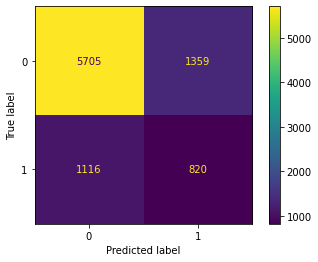

In [ ]:
# Import the modules, read the dataset and create a Pandas data frame.
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier    
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report

cc_client_csv = 'UCI_Credit_Card.csv'
df = pd.read_csv(cc_client_csv)

# Print the first five records
print(df.head(), "\n" + "-" * 100)

# Get the total number of rows and columns, data types of columns and missing values (if exist) in the dataset. 
print(df.info(), "\n" + "-" * 100)

# Rename 'PAY_0' to 'PAY_1', and 'default.payment.next.month' to 'DEFAULT'.
df.rename(columns = {"PAY_0": "PAY_1"}, inplace = True)
df.rename(columns = {"default.payment.next.month": "DEFAULT"}, inplace = True) 

# Check whether the names of the two columns are changed or not.
for i in range(df.shape[1]):
  print(f"At index {i:02}, {df.columns[i]}")
print("-" * 100)

# Remove redundancy in the 'EDUCATION' column.
df.loc[df['EDUCATION'] == 0, 'EDUCATION'] = 5
df.loc[df['EDUCATION'] == 6, 'EDUCATION'] = 5

# Remove redundancy in the 'MARRIAGE' column.
df.loc[df['MARRIAGE'] == 0, 'MARRIAGE'] = 3

# Create the feature and target dataset for training and testing the model.
feature_columns = list(df.columns)
feature_columns.remove('DEFAULT')
feature_columns.remove('ID')

X = df[feature_columns]
y = df['DEFAULT']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 30)

# Modeling a decision tree.
dtree_clf = DecisionTreeClassifier(random_state = 20)
dtree_clf.fit(X_train, y_train)
y_train_pred = dtree_clf.predict(X_train)
y_test_pred = dtree_clf.predict(X_test)

print(f"Accuracy on the train set: {metrics.accuracy_score(y_train, y_train_pred):.4f}\n")
print(f"Accuracy on the test set: {metrics.accuracy_score(y_test, y_test_pred):.4f}")

# Plot a confusion matrix and print a classification report for the test set.
plot_confusion_matrix(dtree_clf, X_test, y_test, values_format = 'd')
print(classification_report(y_test, y_test_pred))

---

#### Plot Decision Tree


In [ ]:
# Create an actual decision tree for the decision tree classifier you have built so far.
# Import the required modules.
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(decision_tree = dtree_clf, out_file = dot_data, filled = True, rounded = True,
                feature_names = feature_columns, class_names = ['0', '1']
                )

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.234732 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.234732 to fit



#Resizing the decision tree

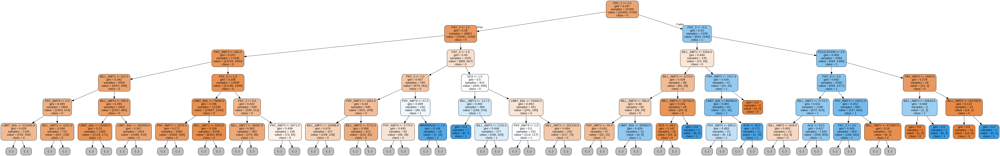

In [ ]:
# Resize the above decision tree using the 'max_depth' parameter.
dot_data = StringIO()
export_graphviz(dtree_clf, max_depth = 5, out_file = dot_data, filled = True, rounded = True, 
                feature_names = feature_columns, class_names = ['0','1']
                )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())

---

#### Decision Tree Creation

Let us again revisit the original dataset, take a small subset of the dataset, and manually build a decision tree without using the `sklearn` module.

As we saw in the correlation matrix, defaulter status depends on few features compared to others. Let us create a smaller dataset by having only the following features to the new dataset:

`['EDUCATION', 'SEX', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'DEFAULT']`

Also, out of 30,000 samples (or rows), let's take only 24 samples randomly from the original data frame. To do this, use the `sample()` function of the `pandas` module. Its **syntax** is:

> `data_frame.sampe(n, random_state)`

where `n` is the number of samples to be taken and `random_state` allows you to take the same sample randomly when set to an integer value. 

In [ ]:
# New smaller data frame from the original data frame.
new_df = df[['EDUCATION', 'SEX', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'DEFAULT']].sample(n = 24, random_state = 5)
print(f"Number of rows = {new_df.shape[0]}\nNumber of cols = {new_df.shape[1]}\n")
new_df.head()

Number of rows = 24
Number of cols = 9



,EDUCATION,SEX,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,DEFAULT
8033,2,1,0,0,-1,0,0,-1,0
29952,2,1,-1,-1,-1,-1,0,-1,0
2736,2,2,0,0,0,0,0,0,0
29677,2,1,0,0,-2,-2,-1,0,0
3285,1,1,0,0,0,0,2,0,0


**Algorithmic Approach** 

Since we are not using the `sklearn` module to build a decision tree, we have to do the following to do the same manually:

1. Compute entropy for a dataset using the following result.

\begin{align}
\text{Entropy} = -\sum_{i=1}^{N}p_i \times \log_{2}(p_i)
\end{align}

2. For each attribute/feature:
  - calculate entropy for all categorical values
  - calculate the weighted average of the entropy values for the current attribute
  - calculate information gain (IG) for the current attribute

3. Choose the feature/attribute having the greatest IG value to split the root node.

4. Repeat the splitting process until we get pure nodes (all leaf nodes).

Now let's define a Python function, say `compute_entropy()`, that takes a data frame as an input and returns the entropy value as an output.

In [ ]:
# A function that takes a data frame as an input and returns entropy value as an output.
def entropy_before_split(new_df):
    target_col_name = new_df.columns[-1]  
    entropy = 0
    unique_values = new_df[target_col_name].unique()    
    for value in unique_values:               
        probability_i = new_df[target_col_name].value_counts()[value] / len(new_df[target_col_name]) 
        entropy += -probability_i * np.log2(probability_i)   
    return entropy

The next step is to compute **entropy after** the **split**, i.e., the entropy of a feature variable (or weighted entropy of the unique values of a feature) in the `new_df` data frame after splitting the root node. 

For this, we need to define another function, say `entropy_after_split()`.

In [ ]:
# A function to calculate the entropy after splitting the value for a feature.
def entropy_after_split(new_df, feature):
  target_col_name = new_df.columns[-1]                        
  feature_unique_values = new_df[feature].unique()    
  weighted_entropy = 0                           
  for feat_uniq_val in feature_unique_values:
      entropy_of_feat_uniq_val = 0 # To store the entropy value of a unique value of a feature variable.
      corres_avail_target_val = new_df.loc[new_df[feature] == feat_uniq_val, target_col_name].value_counts().index.values          
      for val in corres_avail_target_val:
          prob_val = new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()[val] / new_df.shape[0]
          entropy_of_feat_uniq_val += - prob_val * np.log2(prob_val)  
      prop_of_feat_uniq_val = new_df[new_df[feature] == feat_uniq_val].shape[0] / new_df.shape[0]
      weighted_entropy += prop_of_feat_uniq_val * entropy_of_feat_uniq_val 
  return weighted_entropy

Now let's define a function to calculate the information gain (IG) to split a root node. Let's call it `root_node_attribute()` function. This function takes a data frame as an input and returns the node having the greatest information gain value. Inside the function:

- Create empty lists to store entropy and information gain for respective nodes

- Use `for` loop to obtain entropy and information gain for all the features set in data frame. Inside for loop:

  - Get entropy and information gain only for feature columns 

  - Find the entropy after split wrt features and append to `entropies_list` using the `append()` method

  - Obtain the information gain using the formula $\text{IG} = E_b - E_a$ wrt features and append to the `info_gain_list` using the `append()` method

- Finally, return the feature having the greatest information gain value.


In [ ]:
# A function to calculate the Information Gain for split operation.
def root_node_attribute(new_df): 
    entropies_list = []
    info_gain_list = []
    for feature in new_df.columns[:-1]:             
        entropies_list.append(entropy_after_split(new_df, feature))  
        info_gain_list.append(entropy_before_split(new_df) - entropy_after_split(new_df, feature))   
    return new_df.columns[:-1][np.argmax(info_gain_list)]
  
# Find out the attribute (or feature) to split the root node.
root_node_att = root_node_attribute(new_df)
root_node_att

'PAY_1'

Let us now define a function, say `get_subtable()` to obtain the number of samples in a decision node. 

In [ ]:
# A function that returns a sub-table of the 'new_df' data frame.
def get_subtable(new_df, node, value):
    return new_df[new_df[node] == value].reset_index(drop = True)

# A new data frame that is a subtable of 'new_df' having only -1 values in the 'PAY_1' column and reset the index.
subtable = get_subtable(new_df, 'PAY_1', -1)
subtable

,EDUCATION,SEX,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,DEFAULT
0,2,1,-1,-1,-1,-1,0,-1,0
1,1,2,-1,-1,-1,-2,-1,-1,0
2,1,1,-1,-1,-1,-1,-1,-1,0
3,1,2,-1,0,0,0,0,0,0
4,2,2,-1,-1,-1,0,0,0,1


If we look at the `PAY_1` column the values for each row `is equal to -1`. The rows order begin from $0, 1, 2 \dots$

<br>

It is time to put together everything we have done so far and construct the decision tree. The final step is to create a function to build the decision tree. For this, define a function `build_tree()`.

In [ ]:
# The 'build_tree()' function to build a decision tree. 
def build_tree(new_df, tree = None): 
    target = 'DEFAULT'   
    node = root_node_attribute(new_df)
    att_value = np.unique(new_df[node])
    
    if tree is None:                    
        tree = {}
        tree[node] = {}

    for value in att_value:
        subtable = get_subtable(new_df, node, value)
        target_labels, counts = np.unique(subtable[target], return_counts = True)  
        if len(counts) == 1:
            tree[node][value] = target_labels[0]                                                    
        else:        
            tree[node][value] = build_tree(subtable) 
                   
    return tree

In [ ]:
# Print root node, the unique values for it and corresponding sub-table for each unique attribute value.
node = root_node_attribute(new_df)
att_value = np.unique(new_df[node])
target = 'DEFAULT'

print(f"Root node ==> {node}\n")
print(f"Attribute unique values ==> {att_value}\n")

for value in att_value:
    subtable = get_subtable(new_df, node, value)
    target_labels, counts = np.unique(subtable[target], return_counts = True) 
    print(f"\nSubtable for Attribute Value {value}\n\n{subtable}") # Correspondng sub-table for each unique attribute value.
    print(f"\nTarget labels: {target_labels}") # Corresponding target labels for each unique attribute value.
    print(f"Corresponding counts: {counts}\n{'-' * 75}") # Corresponding counts for each label

Root node ==> PAY_1

Attribute unique values ==> [-2 -1  0  1  2  3]


Subtable for Attribute Value -2

   EDUCATION  SEX  PAY_1  PAY_2  PAY_3  PAY_4  PAY_5  PAY_6  DEFAULT
0          2    1     -2     -2     -2     -2     -2     -1        0
1          1    1     -2     -2     -2     -1     -1      0        0

Target labels: [0]
Corresponding counts: [2]
---------------------------------------------------------------------------

Subtable for Attribute Value -1

   EDUCATION  SEX  PAY_1  PAY_2  PAY_3  PAY_4  PAY_5  PAY_6  DEFAULT
0          2    1     -1     -1     -1     -1      0     -1        0
1          1    2     -1     -1     -1     -2     -1     -1        0
2          1    1     -1     -1     -1     -1     -1     -1        0
3          1    2     -1      0      0      0      0      0        0
4          2    2     -1     -1     -1      0      0      0        1

Target labels: [0 1]
Corresponding counts: [4 1]
---------------------------------------------------------------------

---

Construct Decision Tree



In [ ]:
#Construct and print the decision tree
tree = build_tree(new_df)
print(tree)

{'PAY_1': {-2: 0, -1: {'EDUCATION': {1: 0, 2: {'SEX': {1: 0, 2: 1}}}}, 0: {'PAY_3': {-2: 0, -1: 0, 0: 0, 2: 1}}, 1: 1, 2: {'EDUCATION': {1: 0, 2: 1}}, 3: 1}}


We will explore and understand the decision tree after we plot the decision tree with scikit learn libraries too.

Now let's obtain the decision tree for the same dataset using scikit learn library. Model the decision tree using scikit learn libraries:



Accuracy is: 0.75 

              precision    recall  f1-score   support

           0       1.00      0.71      0.83         7
           1       0.33      1.00      0.50         1

    accuracy                           0.75         8
   macro avg       0.67      0.86      0.67         8
weighted avg       0.92      0.75      0.79         8



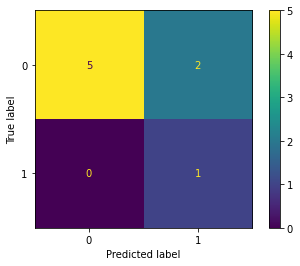

In [ ]:
# Model the decision tree
feature_columns = list(new_df.columns)
feature_columns.remove('DEFAULT')

X = new_df[feature_columns]
y = new_df['DEFAULT']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 8)

dtree_scikit = DecisionTreeClassifier(random_state = 20)
dtree_scikit.fit(X_train, y_train)                  
y_test_pred = dtree_scikit.predict(X_test)       
print("Accuracy is:", metrics.accuracy_score(y_test, y_test_pred), "\n")

plot_confusion_matrix(dtree_scikit, X_test, y_test, values_format = 'd')
print(classification_report(y_test, y_test_pred))

Plot the decision tree.

- Now we have got our decision tree. Now write it to a PNG file by calling the `write_png()` function. Pass a string followed by `.png` as an input to this function to name your PNG file. In this case, we will name our PNG file as `'Credit_Card_Tree.png'`.


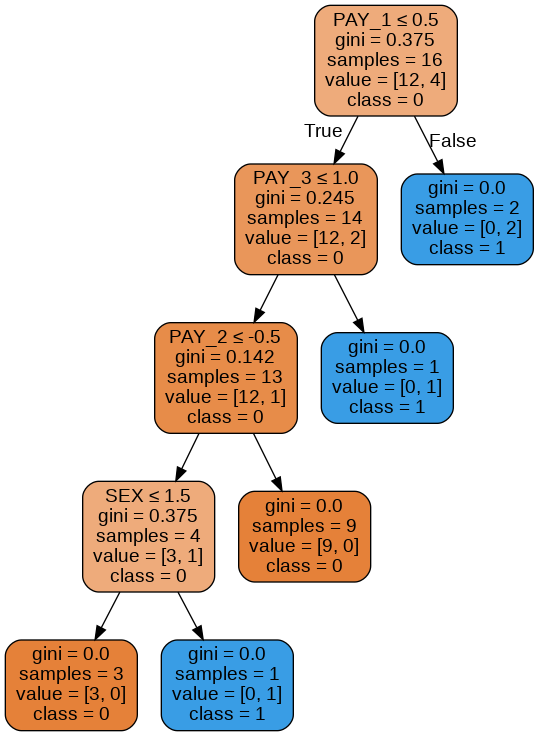

In [ ]:
# Print the decision tree
dot_data = StringIO()
export_graphviz(dtree_scikit, out_file = dot_data,  
                filled = True, rounded = True, special_characters = True, 
                feature_names = feature_columns, class_names = ['0','1']
                )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())

#### Pruning the Decision Tree

Pruning is performed to reduce the size of decision trees by removing sections of the tree that are non-critical and redundant to classify instances. 


In [ ]:
# Pruning the decision tree for various depths

# Building a decision tree model again with the original dataset. 
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier    
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report

feature_columns = list(df.columns)
feature_columns.remove('DEFAULT')
feature_columns.remove('ID')

X = df[feature_columns]
y = df['DEFAULT']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 30)

# Pruning the decision tree.
depth_accuracy = []
for i in range(1, 21):
    dtree_pruned_clf = DecisionTreeClassifier(max_depth = i)
    dtree_pruned_clf.fit(X_train, y_train)                
    dtree_pruned_pred = dtree_pruned_clf.predict(X_test)         
    depth_accuracy.append(metrics.accuracy_score(y_test, dtree_pruned_pred))
    print("Accuracy when max_depth = {0} is {1:.3f}".format(i, metrics.accuracy_score(y_test, dtree_pruned_pred)))

m = max(depth_accuracy)
print("\nThe max accuracy is {0:.3f} when max_depth = {1}".format(max(depth_accuracy), [i + 1 for i, j in enumerate(depth_accuracy) if j == m]))

Accuracy when max_depth = 1 is 0.823
Accuracy when max_depth = 2 is 0.823
Accuracy when max_depth = 3 is 0.824
Accuracy when max_depth = 4 is 0.822
Accuracy when max_depth = 5 is 0.818
Accuracy when max_depth = 6 is 0.819
Accuracy when max_depth = 7 is 0.816
Accuracy when max_depth = 8 is 0.812
Accuracy when max_depth = 9 is 0.812
Accuracy when max_depth = 10 is 0.807
Accuracy when max_depth = 11 is 0.805
Accuracy when max_depth = 12 is 0.796
Accuracy when max_depth = 13 is 0.796
Accuracy when max_depth = 14 is 0.787
Accuracy when max_depth = 15 is 0.785
Accuracy when max_depth = 16 is 0.779
Accuracy when max_depth = 17 is 0.771
Accuracy when max_depth = 18 is 0.767
Accuracy when max_depth = 19 is 0.763
Accuracy when max_depth = 20 is 0.757

The max accuracy is 0.824 when max_depth = [3]



Now we have a decision tree with maximum accuracy. Let us build the tree model with the `max_depth` and visualise the tree:


In [ ]:
# Modeling the pruned decision tree
dtree_clf3 = DecisionTreeClassifier(max_depth = 3, random_state = 20)
dtree_clf3.fit(X_train, y_train)
dtree_pred_clf3 = dtree_clf3.predict(X_test)

print('Accuracy: {0:.3f}'.format(metrics.accuracy_score(y_test, dtree_pred_clf3)))

Accuracy: 0.824


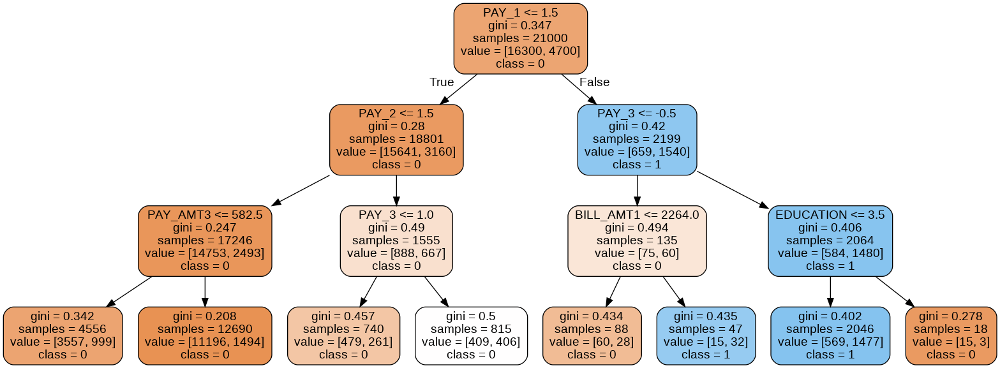

In [ ]:
# Print the pruned decision tree.
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(dtree_clf3, out_file = dot_data, filled = True, rounded = True,
                feature_names = feature_columns, class_names = ['0','1']
                )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())

              precision    recall  f1-score   support

           0       0.84      0.96      0.90      7064
           1       0.70      0.32      0.44      1936

    accuracy                           0.82      9000
   macro avg       0.77      0.64      0.67      9000
weighted avg       0.81      0.82      0.80      9000



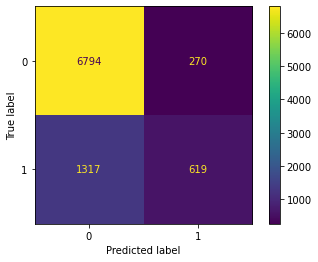

In [ ]:
# S2.4: Model evaluation for the pruned decision tree
plot_confusion_matrix(dtree_clf3, X_test, y_test, values_format = 'd')
print(metrics.classification_report(y_test, dtree_pred_clf3))

For pruned decision tree we have:

- `False Positive` count of 270
- `False Negative` count of 1317


---

#### Improving Classifier Using GridSearchCV

Q. Can we further improve the clasifier performance?

Ans. Yes, we can optimise other hyperparameters as well.

Q. Which parameters will result in an optimised classifier?

Ans. We are not sure. Hence, we need to run the optimization for parameters specified in the `DecisionTreeClassifier`. 

Q. Is there a faster way to do this?

Ans. Yes, Instead of using `for` loop for recursive search `scikit learn` offers a powerfull tool called `GridSearchCV`

<br>

**GridSearchCV**

`GridSearchCV` is a library function that is a member of `sklearn.model_selection` package. It helps to loop through predefined hyperparameters and fit your estimator (model) on your training set. So, in the end, you can select the best parameters from the listed hyperparameters. 

For detailed information: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html 


However, biggest challenge with k fold cross validation is that it takes $k$ times more computational resources/time to model. As the classifier modeling runs $k$ times to yield the cross validation accuracy score.

In [ ]:
# Using 'GridSeachCV' optimising the decision tree classifier model.
from sklearn.model_selection import GridSearchCV

param_grid = {'criterion':['gini','entropy'], 'max_depth': np.arange(2, 10),
              'min_samples_split' : np.arange(5, 10),
              'min_samples_leaf' : np.arange(5, 10),
             'random_state': [20]
              }

# Create a grid
grid_tree = GridSearchCV(DecisionTreeClassifier(), param_grid, scoring = 'accuracy', n_jobs = -1)

# Training
grid_tree.fit(X_train, y_train)

best_tree = grid_tree.best_estimator_
print(best_tree)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=20, splitter='best')


Copy the result obtained from the `GridSeacrhCV` and construct a new decision tree model, say `best_tree_clf`.

              precision    recall  f1-score   support

           0       0.85      0.95      0.89      7064
           1       0.65      0.37      0.47      1936

    accuracy                           0.82      9000
   macro avg       0.75      0.66      0.68      9000
weighted avg       0.80      0.82      0.80      9000



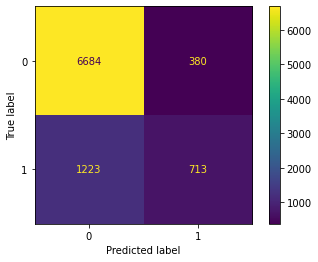

In [ ]:
# Create a new decision tree model with the best tree parameters.
best_tree_clf = DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=20, splitter='best')

best_tree_clf.fit(X_train, y_train)
best_tree_clf_y_pred = best_tree_clf.predict(X_test)
plot_confusion_matrix(best_tree_clf, X_test, y_test, values_format = 'd')
print(classification_report(y_test, best_tree_clf_y_pred))

For GridSearchCV optimised classifier we have:

- `False Positive` count of 1223
- `False Negative` count of 380

For pruned decision tree we had:

- `False Positive` count of 270
- `False Negative` count of 1317

For unpruned classifier we had:

- `False Positive` count of 1359
- `False Negative` count of 1116


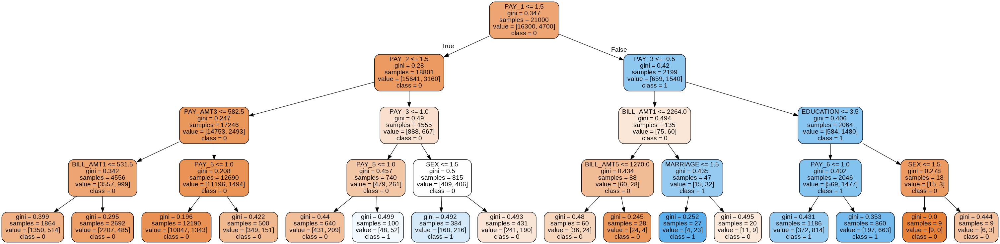

In [ ]:
# Visualise the optimised decision tree
dot_data = StringIO()
export_graphviz(best_tree_clf, out_file=dot_data,  
                filled=True, rounded=True,
                feature_names = feature_columns, class_names=['0','1'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())